# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Taxis" data-toc-modified-id="Taxis-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Taxis</a></div><div class="lev1 toc-item"><a href="#Spike" data-toc-modified-id="Spike-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Spike</a></div><div class="lev1 toc-item"><a href="#Diseases" data-toc-modified-id="Diseases-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Diseases</a></div><div class="lev1 toc-item"><a href="#Gridded-data" data-toc-modified-id="Gridded-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Gridded data</a></div><div class="lev1 toc-item"><a href="#live-data" data-toc-modified-id="live-data-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>live data</a></div><div class="lev1 toc-item"><a href="#Annotating-your-data" data-toc-modified-id="Annotating-your-data-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Annotating your data</a></div><div class="lev1 toc-item"><a href="#Composing-elements" data-toc-modified-id="Composing-elements-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Composing elements</a></div><div class="lev1 toc-item"><a href="#Dimensioned-containers" data-toc-modified-id="Dimensioned-containers-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Dimensioned containers</a></div><div class="lev1 toc-item"><a href="#Composite-objects" data-toc-modified-id="Composite-objects-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Composite objects</a></div>

# Taxis

/Users/klay6683/miniconda3/envs/stable/lib/python3.6/site-packages/seaborn/apionly.py:6: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)



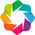

In [1]:
import holoviews as hv
hv.notebook_extension('bokeh', 'matplotlib')

In [2]:
station_info = pd.read_csv("/Users/klay6683/src/holoviews-examples/assets/station_info.csv")
station_info.head()

,name,lat,lon,opened,services,service_names,ridership
0,First Avenue,40.730953,-73.981628,1924,1,['L'],7.702110
1,Second Avenue,40.723402,-73.989938,1936,1,['F'],5.847710
2,Third Avenue,40.732849,-73.986122,1924,1,['L'],2.386533
3,Fifth Avenue,40.753821,-73.981963,1920,6,"['7', 'E', 'M', 'N', 'R', 'W']",16.220605
4,Sixth Avenue,40.737335,-73.996786,1924,1,['L'],16.121318


In [3]:
scatter = hv.Scatter(station_info, kdims=['services'], vdims=['ridership'])
scatter

:Scatter   [services]   (ridership)

In [4]:
layout = scatter + hv.Histogram(np.histogram(station_info['opened'], bins=24), kdims=['openened'])
layout

:Layout
   .Scatter.I   :Scatter   [services]   (ridership)
   .Histogram.I :Histogram   [openened]   (Frequency)

In [5]:
taxi_dropoffs = {hour:arr for hour, arr in np.load('/Users/klay6683/src/holoviews-examples/assets/hourly_taxi_data.npz').items()}

In [6]:
taxi_dropoffs['0'].shape

(256, 256)

# Spike

In [98]:
spike_train = pd.read_csv("/Users/klay6683/src/holoviews-examples/assets/spike_train.csv.gz")
spike_train.head(3)

,milliseconds,Hertz
0,53,50.0
1,62,60.0
2,66,65.0


In [99]:
curve = hv.Curve(spike_train, kdims=['milliseconds'], vdims=['Hertz'],
                 group='Firing Rate',)

In [100]:
spikes = hv.Spikes(spike_train.sample(300), kdims=['milliseconds'], vdims=[], group='Spike Train')

:Layout
   .Firing_Rate.I :Curve   [milliseconds]   (Hertz)
   .Spike_Train.I :Spikes   [milliseconds]
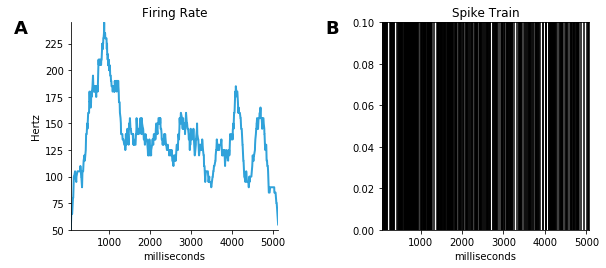

In [101]:
curve + spikes


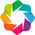

In [103]:
hv.extension('bokeh', 'matplotlib')

In [107]:
%%output size=150
%%opts Curve  [height=100 width=600 xaxis=None tools=['hover']]
%%opts Curve (color='red' line_width=1.5)
%%opts Spikes [height=100 width=600 yaxis=None] (color='grey' line_width=0.25)
curve = hv.Curve(spike_train, kdims=['milliseconds'], vdims=['Hertz'])
spikes = hv.Spikes(spike_train, kdims=['milliseconds'], vdims=[])
(curve+spikes).cols(1)

:Layout
   .Curve.I  :Curve   [milliseconds]   (Hertz)
   .Spikes.I :Spikes   [milliseconds]

In [12]:
spikes.select(milliseconds=(2000, 4000))

:Spikes   [milliseconds]

In [13]:
%output size=150
spikes.select(milliseconds=(2000, 4000))

:Spikes   [milliseconds]

# Diseases

In [14]:
diseases = pd.read_csv("/Users/klay6683/src/holoviews-examples/assets/diseases.csv.gz")

In [15]:
vdims = [('measles', 'Measles Incidence'), ('pertussis', 'Pertussis Incidence')]
ds = hv.Dataset(diseases, kdims=['Year', 'State'], vdims=vdims)

In [16]:
ds = ds.aggregate(function=np.mean)
ds

:Dataset   [Year,State]   (measles,pertussis)

In [17]:
%%opts Curve [width=400 height=250] {+framewise}
(ds.to(hv.Curve, 'Year', 'measles') + ds.to(hv.Curve, 'Year', 'pertussis')).cols(1)

:Layout
   .HoloMap.I  :HoloMap   [State]
      :Curve   [Year]   (measles)
   .HoloMap.II :HoloMap   [State]
      :Curve   [Year]   (pertussis)

In [18]:
%%opts Bars [width=500 height=250 tools=['hover'] group_index=1 legend_position='top_left']
states = ['New York', 'New Jersey', 'California', 'Texas']
ds.select(State=states, Year=(1980, 1990)).to(hv.Bars, ['Year', 'State'], 'measles')

:Bars   [Year,State]   (measles)

In [19]:
%%opts Curve [width=150] (color='indianred')
grouped = ds.select(State=states, Year=(1930, 2005)).to(hv.Curve, 'Year', 'measles')
grouped.grid('State')

:GridSpace   [State]
   :Curve   [Year]   (measles)

In [20]:
%%opts Curve [width=500] (color=Cycle(values=['indianred', 'slateblue', 'lightseagreen', 'coral']))
grouped.overlay('State')

:NdOverlay   [State]
   :Curve   [Year]   (measles)

In [21]:
%%opts Curve [width=600]
agg = ds.aggregate('Year', function=np.mean, spreadfn=np.std)
(hv.Curve(agg) * hv.ErrorBars(agg,vdims=['measles', 'measles_std'])).redim.range(measles=(-1, None))

:Overlay
   .Curve.I     :Curve   [Year]   (measles,pertussis,measles_std,pertussis_std)
   .ErrorBars.I :ErrorBars   [Year]   (measles,measles_std)

In [22]:
agg

------> agg()


:Dataset   [Year]   (measles,pertussis,measles_std,pertussis_std)

# Gridded data

In [23]:
data = np.load('/Users/klay6683/src/holoviews-examples/assets/twophoton.npz')
calcium_array = data['Calcium']
calcium_array.shape

(62, 111, 50)

In [24]:
ds = hv.Dataset((np.arange(50), np.arange(111), np.arange(62), calcium_array),
                kdims=['Time', 'x', 'y'], vdims=['Fluorescence'])
ds

:Dataset   [Time,x,y]   (Fluorescence)

In [25]:
ds.clone(datatype=['xarray']).data

<xarray.Dataset>
Dimensions:       (Time: 50, x: 111, y: 62)
Coordinates:
  * y             (y) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * x             (x) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * Time          (Time) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
Data variables:
    Fluorescence  (y, x, Time) uint16 386 441 196 318 525 443 402 475 520 ...

In [27]:
%opts Image [width=111*3, height=3*62] (cmap='viridis')
ds.to(hv.Image, ['x', 'y']).hist()

:AdjointLayout
   :HoloMap   [Time]
      :Image   [x,y]   (Fluorescence)
   :HoloMap   [Time]
      :Histogram   [Fluorescence]   (Frequency)

In [42]:
ROIs = data['ROIs']
roi_bounds = hv.NdOverlay({i: hv.Bounds(tuple(roi)) for i, roi in enumerate(ROIs)})
print(ROIs.shape)

(147, 4)


In [43]:
%%opts Image [width=400 height=400 xaxis=None yaxis=None] 
%%opts Bounds (color='white') Text (text_color='white' text_font_size='8pt')

opts = dict(halign='left', valign='bottom')
roi_text = hv.NdOverlay({i: hv.Text(roi[0], roi[1], str(i), **opts) for i, roi in enumerate(ROIs)})
(ds[21].to(hv.Image, ['x', 'y']) * roi_bounds * roi_text).relabel('Time: 21')

:HoloMap   [Time]
   :Overlay
      .Image.I      :Image   [x,y]   (Fluorescence)
      .NdOverlay.I  :NdOverlay   [Element]
         :Bounds   [x,y]
      .NdOverlay.II :NdOverlay   [Element]
         :Text   [x,y]

In [50]:
ROIs[60]

array([26, 42, 33, 45])

In [51]:
x0, y0, x1, y1 = ROIs[60]
roi = ds.select(x=(x0, x1), y=(y0, y1), time=(250, 280)).relabel('ROI #60')
roi.to(hv.Image, ['x', 'y'])

:HoloMap   [Time]
   :Image   [x,y]   (Fluorescence)

In [80]:
%%opts GridSpace [shared_xaxis=True shared_yaxis=True]
%%output info=True
roi.to(hv.Image, kdims=['x', 'Time'])

:HoloMap   [y]
   :Image   [x,Time]   (Fluorescence)

In [70]:
%%opts Overlay [show_legend=True width=600]
agg = roi.aggregate('Time', np.mean, spreadfn=np.std)
(hv.Curve(agg) * hv.Spread(agg)).relabel("Mean window response")

:Overlay
   .Curve.ROI_number_60  :Curve   [Time]   (Fluorescence,Fluorescence_std)
   .Spread.ROI_number_60 :Spread   [Time]   (Fluorescence,Fluorescence_std)

# live data

In [71]:
%opts Curve [show_grid=False xaxis=None yaxis=None]

In [73]:
def clifford(a,b,c,d,x0,y0):
    xn,yn = x0,y0
    coords = [(x0,y0)]
    for i in range(10000):
        x_n1 = np.sin(a*yn) + c*np.cos(a*xn)
        y_n1 = np.sin(b*xn) + d*np.cos(b*yn)
        xn,yn = x_n1,y_n1
        coords.append((xn,yn))
    return coords

def clifford_attractor(a,b,c,d):
    return hv.Curve(clifford(a,b,c,d,x0=0,y0=0))


In [74]:
%%opts Curve (line_width=0.03 color='red')
clifford_attractor(a =-1.5, b=1.5, c=1, d=0.75 )

:Curve   [x]   (y)

In [75]:
dmap = hv.DynamicMap(clifford_attractor, kdims=['a','b','c','d'])
dmap

DynamicMap cannot be displayed without explicit indexing as 'a', 'b', 'c', 'd' dimension(s) are unbounded. 
Set dimensions bounds with the DynamicMap redim.range or redim.values methods.

:DynamicMap   [a,b,c,d]

In [76]:
%%opts Curve (line_width=0.03 color='green')
# When run live, this cell's output should match the behavior of the GIF below
dmap.redim.range(a=(-1.5,-1),b=(1.5,2),c=(1,1.2),d=(0.75,0.8))

:DynamicMap   [a,b,c,d]

In [77]:
def interactive_clifford(a,b,c,d,x=0,y=0):
    coords = clifford(a,b,c,d,x0=x,y0=y)
    return (hv.Curve(coords) * hv.Points(coords[0]) * hv.Curve(coords[:2], group='Init')
            * hv.Text(-0.75,1.35, 'x:{x:.2f} y:{y:.2f}'.format(x=coords[0][0],y=coords[0][1])))

In [78]:
from holoviews.streams import PointerXY

In [79]:
%%opts Curve (line_width=0.03 color='blue') Points (color='red' size=10) Curve.Init (color='red' line_width=2)
# When run live, this cell's output should match the behavior of the GIF below
dmap = hv.DynamicMap(interactive_clifford, kdims=['a','b','c','d'], streams=[PointerXY(x=0,y=0)])
dmap.redim.range(a=(-1.4,-1),b=(1.6,1.8),c=(1,1.5),d=(0.7,0.8))

:DynamicMap   [a,b,c,d]

In [83]:
arr = np.random.rand(5,10)
arr.shape

(5, 10)

In [89]:
hv.extension()

In [87]:
import geoviews as gv

:Image   [x,y]   (z)
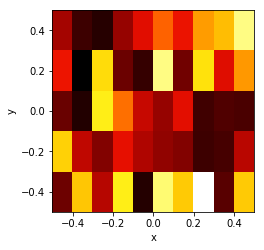

In [90]:
img = hv.Image(arr)
img

:Raster   [x,y]   (z)
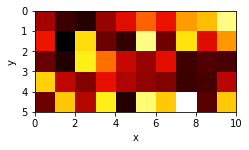

In [91]:
raster = hv.Raster(arr)
raster

# Annotating your data

:Curve   [x]   (y)
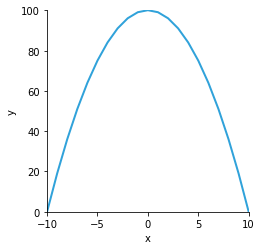

In [92]:
xs = range(-10,11)
ys = [100-el**2 for el in xs]
curve = hv.Curve((xs, ys))
curve

:Layout
   .Curve.I  :Curve   [distance]   (height)
   .Curve.II :Curve   [distance]   (height)
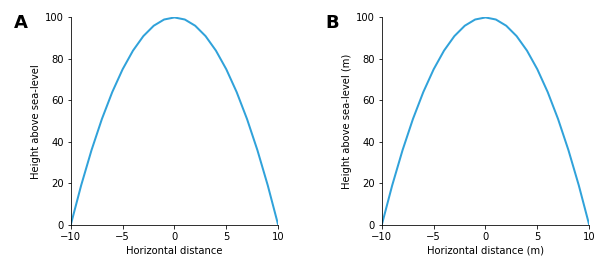

In [93]:
distance = hv.Dimension('distance', label='Horizontal distance', unit='m')
height = hv.Dimension(('height','Height above sea-level'), unit='m')

wo_unit = hv.Curve((xs, ys), 
                   kdims=[('distance','Horizontal distance')], 
                   vdims=[('height','Height above sea-level')])
with_unit = hv.Curve((xs, ys), kdims=[distance], vdims=[height])

wo_unit + with_unit

# Composing elements 

In [94]:
xvals = [0.1* i for i in range(100)]
curve =  hv.Curve((xvals, [np.sin(x) for x in xvals]))
scatter =  hv.Scatter((xvals[::5], np.linspace(0,1,20)))

:Overlay
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)
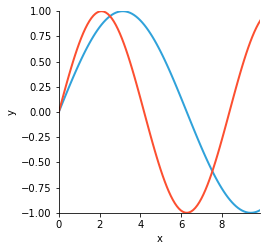

In [97]:
curve_list   = [hv.Curve((xvals, [np.sin(f*x) for x in xvals])) for f in [0.5, 0.75]]
scatter_list = [hv.Scatter((xvals[::5], f*np.linspace(0,1,20))) for f in [-0.5, 0.5]]
# overlay = hv.Overlay(curve_list + scatter_list)
# overlay
hv.Overlay(curve_list)

# Dimensioned containers


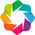

In [2]:
hv.notebook_extension('bokeh')
%opts Curve (line_width=1)

In [6]:
def fm_modulation(f_carrier=220, f_mod=220, mod_index=1, length=0.1, sampleRate=2000):
    sampleInc = 1.0/sampleRate
    x = np.arange(0,length, sampleInc)
    y = np.sin(2*np.pi*f_carrier*x + mod_index*np.sin(2*np.pi*f_mod*x))
    return hv.Curve((x, y), kdims=['Time'], vdims=['Amplitude'])

In [9]:
%%opts Curve [width=600]
f_carrier = np.linspace(20, 60, 3)
f_mod = np.linspace(20, 100, 5)

curve_dict = {(fc, fm): fm_modulation(fc, fm) for fc in f_carrier for fm in f_mod}

kdims = [('f_carrier', 'Carrier frequency'), ('f_mod', 'Modulation frequency')]
holomap = hv.HoloMap(curve_dict, kdims=kdims)
holomap

:HoloMap   [f_carrier,f_mod]
   :Curve   [Time]   (Amplitude)

# Composite objects 


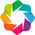

In [3]:
hv.extension('bokeh')
np.random.seed(10)

def sine_curve(phase, freq, amp, power, samples=102):
    xvals = [0.1* i for i in range(samples)]
    return [(x, amp*np.sin(phase+freq*x)**power) for x in xvals]

phases =      [0, np.pi/2, np.pi, 3*np.pi/2]
powers =      [1,2,3]
amplitudes =  [0.5,0.75, 1.0]
frequencies = [0.5, 0.75, 1.0, 1.25, 1.5, 1.75]


gridspace = hv.GridSpace(kdims=['Amplitude', 'Power'], group='Parameters', label='Sines')

for power in powers:
    for amplitude in amplitudes:
        holomap = hv.HoloMap(kdims=['Frequency'])
        for frequency in frequencies:
            sines = {phase : hv.Curve(sine_curve(phase, frequency, amplitude, power))
                     for phase in phases}
            ndoverlay = hv.NdOverlay(sines , kdims=['Phase']).relabel(group='Phases',
                                                                      label='Sines', depth=1)
            overlay = ndoverlay * hv.Points([(i,0) for i in range(0,10)], group='Markers', label='Dots')
            holomap[frequency] = overlay
        gridspace[amplitude, power] = holomap

penguins = hv.RGB(np.random.randn(400,200,3)).relabel(group="Family", label="Penguin")

layout = gridspace + penguins

In [5]:
layout

:Layout
   .Parameters.Sines :GridSpace   [Amplitude,Power]
      :HoloMap   [Frequency]
         :Overlay
            .Phases.Sines :NdOverlay   [Phase]
               :Curve   [x]   (y)
            .Markers.Dots :Points   [x,y]
   .Family.Penguin   :RGB   [x,y]   (R,G,B)

In [6]:
layout.Parameters.Sines[0.5, 1]

:HoloMap   [Frequency]
   :Overlay
      .Phases.Sines :NdOverlay   [Phase]
         :Curve   [x]   (y)
      .Markers.Dots :Points   [x,y]

In [10]:
layout.Parameters.Sines[0.5, 1][1].Phases.Sines[0.0][5.1]

-0.46290734116386606